 #  A Whale off the Port(folio)
 ---

 In this assignment, you'll get to use what you've learned this week to evaluate the performance among various algorithmic, hedge, and mutual fund portfolios and compare them against the S&P 500 Index.

In [1]:
# Initial imports
import pandas as pd
import numpy as np
from datetime import datetime as dt
from pathlib import Path
import matplotlib.pyplot as plt

%matplotlib inline

# Data Cleaning

In this section, you will need to read the CSV files into DataFrames and perform any necessary data cleaning steps. After cleaning, combine all DataFrames into a single DataFrame.

Files:

* `whale_returns.csv`: Contains returns of some famous "whale" investors' portfolios.

* `algo_returns.csv`: Contains returns from the in-house trading algorithms from Harold's company.

* `sp500_history.csv`: Contains historical closing prices of the S&P 500 Index.

## Whale Returns

Read the Whale Portfolio daily returns and clean the data

In [2]:
# Reading whale returns
whale_returns = pd.read_csv(Path("Resources/whale_returns.csv"))

In [3]:
# Count nulls
whale_returns.isna().sum()

Date                           0
SOROS FUND MANAGEMENT LLC      1
PAULSON & CO.INC.              1
TIGER GLOBAL MANAGEMENT LLC    1
BERKSHIRE HATHAWAY INC         1
dtype: int64

In [4]:
# Drop nulls
whale_returns = whale_returns.dropna()
whale_returns['Date'] = pd.to_datetime(whale_returns['Date']).dt.date
whale_returns = whale_returns.set_index('Date')

## Algorithmic Daily Returns

Read the algorithmic daily returns and clean the data

In [5]:
# Reading algorithmic returns
algo_returns = pd.read_csv(Path("Resources/algo_returns.csv"))

In [6]:
# Count nulls
algo_returns.isna().sum()

Date      0
Algo 1    0
Algo 2    6
dtype: int64

In [7]:
# Drop nulls
algo_returns = algo_returns.dropna()
algo_returns['Date'] = pd.to_datetime(algo_returns['Date']).dt.date
algo_returns = algo_returns.set_index('Date')

## S&P 500 Returns

Read the S&P 500 historic closing prices and create a new daily returns DataFrame from the data. 

In [8]:
# Reading S&P 500 Closing Prices
sp500_close = pd.read_csv(Path("Resources/sp500_history.csv"))

In [9]:
# Check Data Types
type(sp500_close.iloc[0 ,0]), type(sp500_close.iloc[0 ,1])

(str, str)

In [10]:
# Fix Data Types
sp500_close['Date'] = pd.to_datetime(sp500_close['Date']).dt.date
sp500_close = sp500_close.set_index('Date')
sp500_close['Close'] = sp500_close['Close'].str.replace("$", "").astype('float')

<ipython-input-10-aa904fbabaf8>:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  sp500_close['Close'] = sp500_close['Close'].str.replace("$", "").astype('float')


In [11]:
# Calculate Daily Returns
sp500_close['DailyReturns'] = sp500_close.pct_change()

In [12]:
# Drop nulls
sp500_close = sp500_close.dropna()

In [13]:
# Rename `Close` Column to be specific to this portfolio.
sp500_returns = sp500_close.drop(columns=['Close'])
sp500_returns = sp500_returns.rename(columns={'DailyReturns': 'S&P 500'})

## Combine Whale, Algorithmic, and S&P 500 Returns

In [14]:
# Join Whale Returns, Algorithmic Returns, and the S&P 500 Returns into a single DataFrame with columns for each portfolio's returns.
all_returns = pd.concat([whale_returns, algo_returns, sp500_returns], join="inner", axis=1)
all_returns

,SOROS FUND MANAGEMENT LLC,PAULSON & CO.INC.,TIGER GLOBAL MANAGEMENT LLC,BERKSHIRE HATHAWAY INC,Algo 1,Algo 2,S&P 500
Date,,,,,,,
2015-03-03,-0.001266,-0.004981,-0.000496,-0.006569,-0.001942,-0.000949,0.004408
2015-03-04,0.002230,0.003241,-0.002534,0.004213,-0.008589,0.002416,-0.001195
2015-03-05,0.004016,0.004076,0.002355,0.006726,-0.000955,0.004323,0.014378
2015-03-06,-0.007905,-0.003574,-0.008481,-0.013098,-0.004957,-0.011460,-0.003929
2015-03-09,0.000582,0.004225,0.005843,-0.001652,-0.005447,0.001303,0.017254
...,...,...,...,...,...,...,...
2019-04-15,-0.001422,-0.001156,0.000398,-0.010492,-0.004331,-0.004572,-0.000509
2019-04-16,0.002699,0.000388,-0.000831,0.000837,-0.006945,0.002899,0.002279
2019-04-17,-0.002897,-0.006467,-0.004409,0.003222,-0.010301,-0.005228,-0.001577


---

# Conduct Quantitative Analysis

In this section, you will calculate and visualize performance and risk metrics for the portfolios.

## Performance Anlysis

#### Calculate and Plot the daily returns.

In [45]:
# Plot daily returns of all portfolios
fig, ax = plt.subplots()
all_returns.plot(figsize=[300,80], fontsize=140, ax=ax)
ax.set_title("All Returns", fontsize=160)
ax.legend(fontsize=120)

#### Calculate and Plot cumulative returns.

<AxesSubplot:xlabel='Entity'>

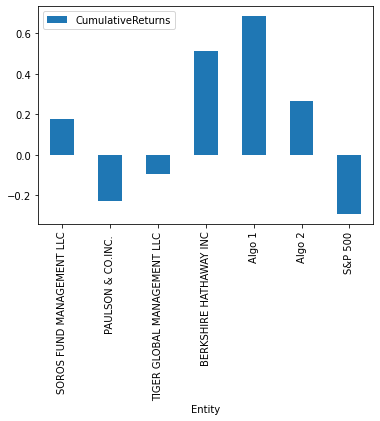

In [16]:
# Calculate cumulative returns of all portfolios
cumulative_returns = pd.DataFrame(
    data=[["SOROS FUND MANAGEMENT LLC", all_returns['SOROS FUND MANAGEMENT LLC'].sum()], 
    ["PAULSON & CO.INC. ", all_returns['PAULSON & CO.INC. '].sum()], 
    ["TIGER GLOBAL MANAGEMENT LLC", all_returns['TIGER GLOBAL MANAGEMENT LLC'].sum()],
    ["BERKSHIRE HATHAWAY INC", all_returns['BERKSHIRE HATHAWAY INC'].sum()],
    ['Algo 1', all_returns['Algo 1'].sum()],
    ['Algo 2', all_returns['Algo 2'].sum()],
    ['S&P 500', all_returns['S&P 500'].sum()]], columns=['Entity', 'CumulativeReturns'])
# cumulative_returns['CumulativeReturns'] = pd.to_numeric(cumulative_returns['CumulativeReturns'])
cumulative_returns['CumulativeReturns'] = cumulative_returns['CumulativeReturns'].astype('float')
cumulative_returns = cumulative_returns.set_index('Entity')
# Plot cumulative returns
cumulative_returns.plot(kind="bar")
# cumulative_returns

---

## Risk Analysis

Determine the _risk_ of each portfolio:

1. Create a box plot for each portfolio. 
2. Calculate the standard deviation for all portfolios
4. Determine which portfolios are riskier than the S&P 500
5. Calculate the Annualized Standard Deviation

### Create a box plot for each portfolio


Text(0.5, 1.0, 'Risk Analysis')

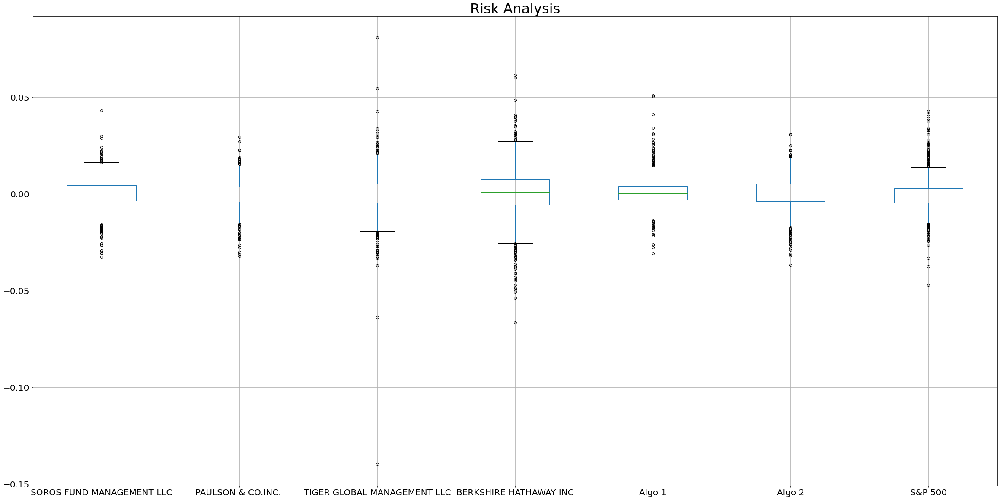

In [62]:
# Box plot to visually show risk
# fig, ax = plt.subplots()
all_returns.boxplot(figsize=(40, 20), fontsize=20).set_title('Risk Analysis', fontsize=32)


### Calculate Standard Deviations

In [18]:
# Calculate the daily standard deviations of all portfolios
all_returns.std()

SOROS FUND MANAGEMENT LLC      0.007896
PAULSON & CO.INC.              0.007026
TIGER GLOBAL MANAGEMENT LLC    0.010897
BERKSHIRE HATHAWAY INC         0.012919
Algo 1                         0.007623
Algo 2                         0.008341
S&P 500                        0.008587
dtype: float64

### Determine which portfolios are riskier than the S&P 500

In [19]:
# Calculate  the daily standard deviation of S&P 500
all_returns['S&P 500'].std()
# Determine which portfolios are riskier than the S&P 500
riskier_portfolios = pd.DataFrame()
if all_returns['SOROS FUND MANAGEMENT LLC'].std() > all_returns['S&P 500'].std():
    riskier_portfolios = riskier_portfolios.join(all_returns['SOROS FUND MANAGEMENT LLC'], how='right')
if all_returns['PAULSON & CO.INC. '].std() > all_returns['S&P 500'].std():
    riskier_portfolios = riskier_portfolios.join(all_returns['PAULSON & CO.INC. '], how='right')
if all_returns['TIGER GLOBAL MANAGEMENT LLC'].std() > all_returns['S&P 500'].std():
    riskier_portfolios = riskier_portfolios.join(all_returns['TIGER GLOBAL MANAGEMENT LLC'], how='right')
if all_returns['BERKSHIRE HATHAWAY INC'].std() > all_returns['S&P 500'].std():
    riskier_portfolios = riskier_portfolios.join(all_returns['BERKSHIRE HATHAWAY INC'], how='right')
if all_returns['Algo 1'].std() > all_returns['S&P 500'].std():
    riskier_portfolios = riskier_portfolios.join(all_returns['Algo 1'], how='right')
if all_returns['Algo 2'].std() > all_returns['S&P 500'].std():
    riskier_portfolios = riskier_portfolios.join(all_returns['Algo 2'], how='right')

riskier_portfolios

,TIGER GLOBAL MANAGEMENT LLC,BERKSHIRE HATHAWAY INC
Date,,
2015-03-03,-0.000496,-0.006569
2015-03-04,-0.002534,0.004213
2015-03-05,0.002355,0.006726
2015-03-06,-0.008481,-0.013098
2015-03-09,0.005843,-0.001652
...,...,...
2019-04-15,0.000398,-0.010492
2019-04-16,-0.000831,0.000837
2019-04-17,-0.004409,0.003222


### Calculate the Annualized Standard Deviation

In [20]:
# Calculate the annualized standard deviation (252 trading days)
all_returns.std() * np.sqrt(252)

SOROS FUND MANAGEMENT LLC      0.125348
PAULSON & CO.INC.              0.111527
TIGER GLOBAL MANAGEMENT LLC    0.172989
BERKSHIRE HATHAWAY INC         0.205079
Algo 1                         0.121006
Algo 2                         0.132413
S&P 500                        0.136313
dtype: float64

---

## Rolling Statistics

Risk changes over time. Analyze the rolling statistics for Risk and Beta. 

1. Calculate and plot the rolling standard deviation for the S&P 500 using a 21-day window
2. Calculate the correlation between each stock to determine which portfolios may mimick the S&P 500
3. Choose one portfolio, then calculate and plot the 60-day rolling beta between it and the S&P 500

### Calculate and plot rolling `std` for all portfolios with 21-day window

Text(0.5, 1.0, 'Rolling 21 Day Std. Dev.')

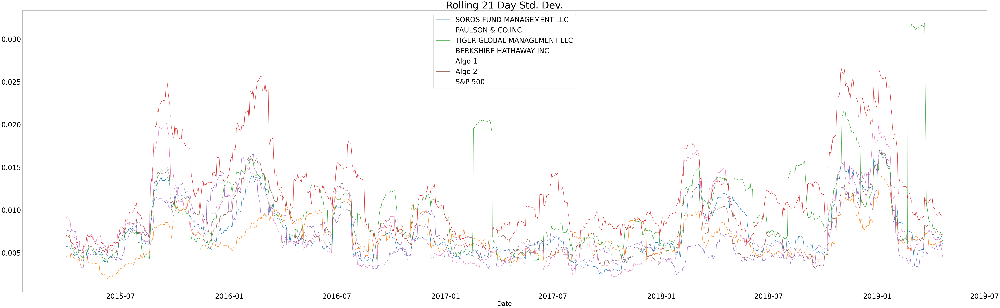

In [65]:
# Calculate the rolling standard deviation for all portfolios using a 21-day window
rolling_std_deviation = all_returns.rolling(window=21).std()
# Plot the rolling standard deviation
fig, ax = plt.subplots()
rolling_std_deviation.plot(figsize=[100, 30], fontsize=40, ax=ax)
ax.legend(fontsize=40)
ax.set_xlabel('Date', fontsize=36)
ax.set_title('Rolling 21 Day Std. Dev.', fontsize=56)

### Calculate and plot the correlation

Text(0.5, 0, 'Entity')

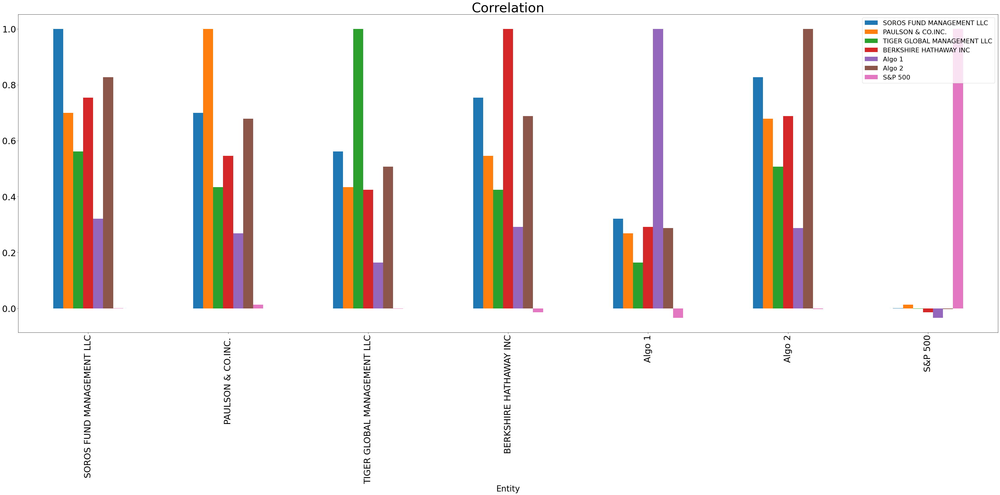

In [68]:
# Calculate the correlation
all_returns_correlation = all_returns.corr()
fig, ax = plt.subplots()
all_returns_correlation.plot(kind="bar", figsize=[60, 20], fontsize=30, ax=ax)
ax.legend(fontsize=22)
ax.set_title('Correlation', fontsize=45)
ax.set_xlabel('Entity', fontsize=28)

### Calculate and Plot Beta for a chosen portfolio and the S&P 500

Text(0.5, 1.0, 'Beta (Algo 1 / S&P 500)')

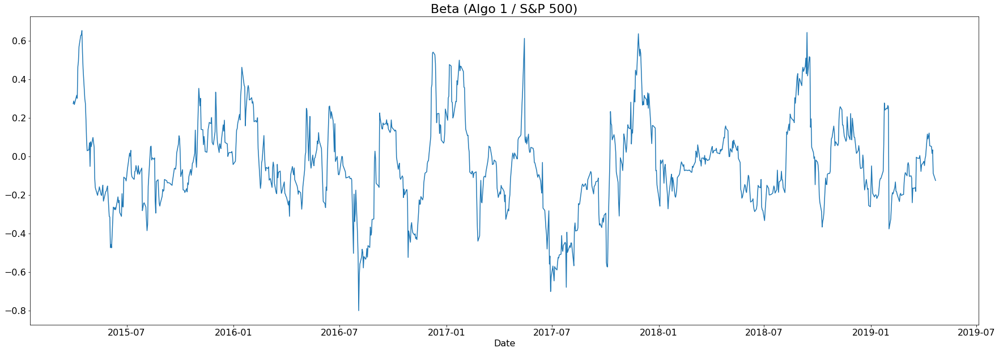

In [70]:
# Calculate covariance of a single portfolio
algo1_covariance = all_returns['Algo 1'].rolling(window=21).cov(all_returns['S&P 500'])
# Calculate variance of S&P 500
sp500_variance = all_returns['S&P 500'].rolling(window=21).var()
# Computing beta
algo_sp_beta = algo1_covariance / sp500_variance
# Plot beta trend
# algo1_covariance, sp500_variance, algo_sp_beta
fig, ax = plt.subplots()
algo_sp_beta.plot(figsize=[30,10], fontsize=16, ax=ax)
ax.set_xlabel('Date', fontsize=16)
ax.set_title('Beta 21 Day(Algo 1 / S&P 500)', fontsize=22)

## Rolling Statistics Challenge: Exponentially Weighted Average 

An alternative way to calculate a rolling window is to take the exponentially weighted moving average. This is like a moving window average, but it assigns greater importance to more recent observations. Try calculating the [`ewm`](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.ewm.html) with a 21-day half-life.

In [24]:
# Use `ewm` to calculate the rolling window
all_ewm = all_returns.ewm(halflife=21)
all_ewm

ExponentialMovingWindow [com=29.799346392775035,min_periods=1,adjust=True,ignore_na=False,axis=0]

---

# Sharpe Ratios
In reality, investment managers and thier institutional investors look at the ratio of return-to-risk, and not just returns alone. After all, if you could invest in one of two portfolios, and each offered the same 10% return, yet one offered lower risk, you'd take that one, right?

### Using the daily returns, calculate and visualize the Sharpe ratios using a bar plot

In [25]:
# Annualized Sharpe Ratios
all_sharpe_ratios = (all_returns.mean() * 252) / (all_returns.std() * np.sqrt(252))

Text(0.5, 1.0, 'Sharpe Ratio')

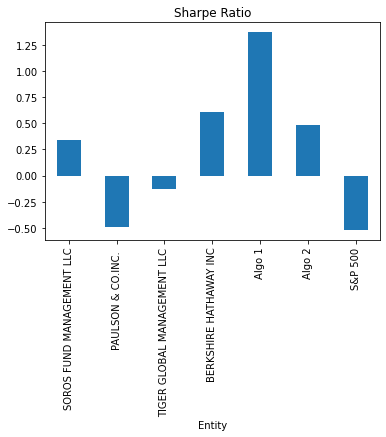

In [71]:
# Visualize the sharpe ratios as a bar plot
fig, ax = plt.subplots()
all_sharpe_ratios.plot(kind="bar", ax=ax)
ax.set_xlabel('Entity')
ax.set_title('Sharpe Ratio')

### Determine whether the algorithmic strategies outperform both the market (S&P 500) and the whales portfolios.

    * First thing I noticed is that one algorithim was completely independent of the other so the correlation between the two is somewhat indeterniable to classify them as one entity except for the fact that they both are ran by a machine. 
    * Second note I would like to add is that the same situation occurs with the different "whale" portfolios consisting of Hedge Funds and Wealthy Individuals
    * With that said I have to conclude that independently "Algo 1" seems to way outperform the other portfolios and have noticed a higher correlation between identified algo and the base variance that is the S&P 500
    * Moving on to the second algorithm named "Algo 2" I have noticed on average the algorithm does outperform most portfolios but "Berkshire Hathaway" seems to also share that analysis with a bit more of a performance increase
    * In conclusion I would say the algorithms used here seem to outperform the other portfolios on average but do present more risk

---

# Create Custom Portfolio

In this section, you will build your own portfolio of stocks, calculate the returns, and compare the results to the Whale Portfolios and the S&P 500. 

1. Choose 3-5 custom stocks with at last 1 year's worth of historic prices and create a DataFrame of the closing prices and dates for each stock.
2. Calculate the weighted returns for the portfolio assuming an equal number of shares for each stock
3. Join your portfolio returns to the DataFrame that contains all of the portfolio returns
4. Re-run the performance and risk analysis with your portfolio to see how it compares to the others
5. Include correlation analysis to determine which stocks (if any) are correlated

## Choose 3-5 custom stocks with at last 1 year's worth of historic prices and create a DataFrame of the closing prices and dates for each stock.

For this demo solution, we fetch data from three companies listes in the S&P 500 index.

* `GOOG` - [Google, LLC](https://en.wikipedia.org/wiki/Google)

* `AAPL` - [Apple Inc.](https://en.wikipedia.org/wiki/Apple_Inc.)

* `COST` - [Costco Wholesale Corporation](https://en.wikipedia.org/wiki/Costco)

In [27]:
# Reading data from 1st stock
goog_path = Path("./Resources/goog_historical.csv")
goog_df = pd.read_csv(goog_path)

In [28]:
# Reading data from 2nd stock
aapl_path = Path("./Resources/aapl_historical.csv")
aapl_df = pd.read_csv(aapl_path)

In [29]:
# Reading data from 3rd stock
cost_path = Path("./Resources/cost_historical.csv")
cost_df = pd.read_csv(cost_path)

In [30]:
# Combine all stocks in a single DataFrame
all_stocks = pd.concat([goog_df, aapl_df, cost_df], join="inner", axis=1)
all_stocks

,Symbol,Trade DATE,NOCP,Symbol,Trade DATE,NOCP,Symbol,Trade DATE,NOCP
0,GOOG,5/9/2019,1162.38,AAPL,5/9/2019,200.72,COST,5/9/2019,243.47
1,GOOG,5/8/2019,1166.27,AAPL,5/8/2019,202.90,COST,5/8/2019,241.34
2,GOOG,5/7/2019,1174.10,AAPL,5/7/2019,202.86,COST,5/7/2019,240.18
3,GOOG,5/6/2019,1189.39,AAPL,5/6/2019,208.48,COST,5/6/2019,244.23
4,GOOG,5/3/2019,1185.40,AAPL,5/3/2019,211.75,COST,5/3/2019,244.62
...,...,...,...,...,...,...,...,...,...
245,GOOG,5/17/2018,1078.59,AAPL,5/17/2018,186.99,COST,5/17/2018,199.60
246,GOOG,5/16/2018,1081.77,AAPL,5/16/2018,188.18,COST,5/16/2018,198.71
247,GOOG,5/15/2018,1079.23,AAPL,5/15/2018,186.44,COST,5/15/2018,195.48
248,GOOG,5/14/2018,1100.20,AAPL,5/14/2018,188.15,COST,5/14/2018,195.88


In [31]:
# Reset Date index
all_stocks.rename(columns={"Trade DATE": "Date"}, inplace=True)
all_stocks = all_stocks.T.drop_duplicates().T
all_stocks['Date'] = pd.to_datetime(all_stocks['Date']).dt.date
all_stocks = all_stocks.set_index('Date')

In [32]:
# Reorganize portfolio data by having a column per symbol
symbol_names = all_stocks.loc[:, ::2].values[0]
closing_prices = all_stocks.iloc[:, 1::2]
closing_prices.columns = symbol_names
closing_prices

,GOOG,AAPL,COST
Date,,,
2019-05-09,1162.38,200.72,243.47
2019-05-08,1166.27,202.9,241.34
2019-05-07,1174.1,202.86,240.18
2019-05-06,1189.39,208.48,244.23
2019-05-03,1185.4,211.75,244.62
...,...,...,...
2018-05-17,1078.59,186.99,199.6
2018-05-16,1081.77,188.18,198.71
2018-05-15,1079.23,186.44,195.48


In [33]:
# Calculate daily returns
daily_returns = closing_prices.pct_change()
# Drop NAs
daily_returns = daily_returns.dropna()
# Display sample data
daily_returns.head(10)

,GOOG,AAPL,COST
Date,,,
2019-05-08,0.003347,0.010861,-0.008749
2019-05-07,0.006714,-0.000197,-0.004806
2019-05-06,0.013023,0.027704,0.016862
2019-05-03,-0.003355,0.015685,0.001597
2019-05-02,-0.019226,-0.012279,-0.007890
2019-05-01,0.004705,0.006550,-0.004533
2019-04-30,0.017465,-0.046789,0.016309
2019-04-29,0.083384,0.019634,-0.005091
2019-04-26,-0.011960,-0.001515,-0.001883


## Calculate the weighted returns for the portfolio assuming an equal number of shares for each stock

In [34]:
# Set weights
weights = [1/3, 1/3, 1/3]

# Calculate portfolio return
portfolio_weighted_returns = daily_returns.dot(weights)
# Display sample data
portfolio_weighted_returns.head(10)

Date
2019-05-08    0.001820
2019-05-07    0.000570
2019-05-06    0.019196
2019-05-03    0.004642
2019-05-02   -0.013131
2019-05-01    0.002241
2019-04-30   -0.004339
2019-04-29    0.032642
2019-04-26   -0.005120
2019-04-25    0.001745
dtype: float64

## Join your portfolio returns to the DataFrame that contains all of the portfolio returns

In [35]:
# Join your returns DataFrame to the original returns DataFrame
daily_returns["MyReturns"] = portfolio_weighted_returns

Text(0.5, 1.0, 'Daily Returns')

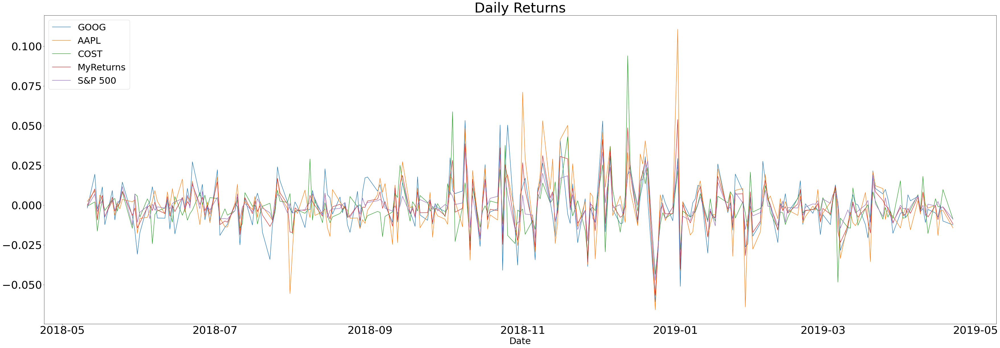

In [74]:
# Only compare dates where return data exists for all the stocks (drop NaNs)
daily_returns = daily_returns.dropna()
fig, ax = plt.subplots()
daily_returns.plot(figsize=[60, 20], fontsize=38, ax=ax)
ax.legend(fontsize=32, loc="upper left")
ax.set_xlabel('Date', fontsize=32)
ax.set_title('Daily Returns', fontsize=48)

## Re-run the risk analysis with your portfolio to see how it compares to the others

### Calculate the Annualized Standard Deviation

<AxesSubplot:title={'center':'Annual Standard Deviation'}, xlabel='Entity'>

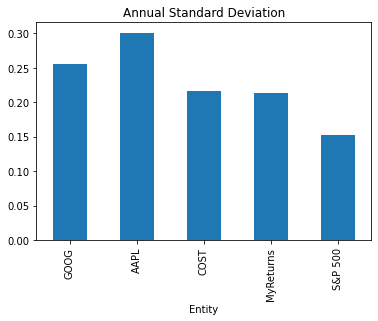

In [75]:
# Calculate the annualized `std`
annualize_standard_deviation = daily_returns.std() * np.sqrt(252)
annualize_standard_deviation.plot(kind='bar', title='Annual Standard Deviation', xlabel="Entity")

### Calculate and plot rolling `std` with 21-day window

<AxesSubplot:title={'center':'Rolling 21 Day Std. Dev.'}, xlabel='Date'>

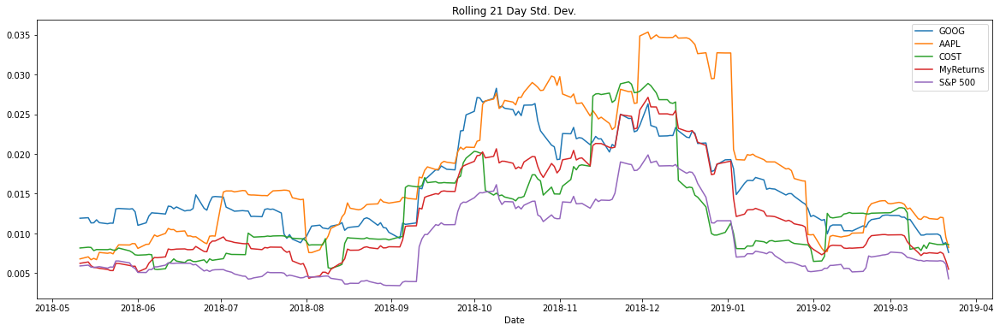

In [78]:
# Calculate rolling standard deviation
rolling_21_standard_deviation = daily_returns.rolling(window=21).std()
# Plot rolling standard deviation
rolling_21_standard_deviation.plot(title='Rolling 21 Day Std. Dev.', figsize=(20, 6))

### Calculate and plot the correlation

Text(0.5, 1.0, 'Correlation')

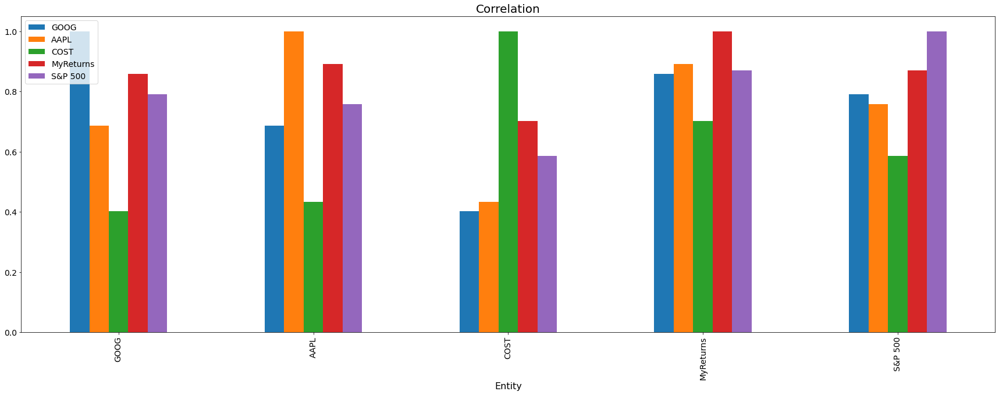

In [92]:
# Calculate and plot the correlation
portfolio_correlation = daily_returns.corr()
fig, ax = plt.subplots()
portfolio_correlation.plot(kind="bar", fontsize=14, figsize=(30, 10), ax=ax)
ax.legend(loc="upper left", fontsize=14)
ax.set_xlabel('Entity', fontsize=16)
ax.set_title('Correlation', fontsize=20)

In [40]:
# Merge S&P 500 returns to new portfolio dataframe
daily_returns = daily_returns.join(all_returns['S&P 500'], how='inner')

### Calculate and Plot Rolling 60-day Beta for Your Portfolio compared to the S&P 500

Text(0.5, 1.0, 'Beta 60 Day(My Portfolio / S&P 500)')

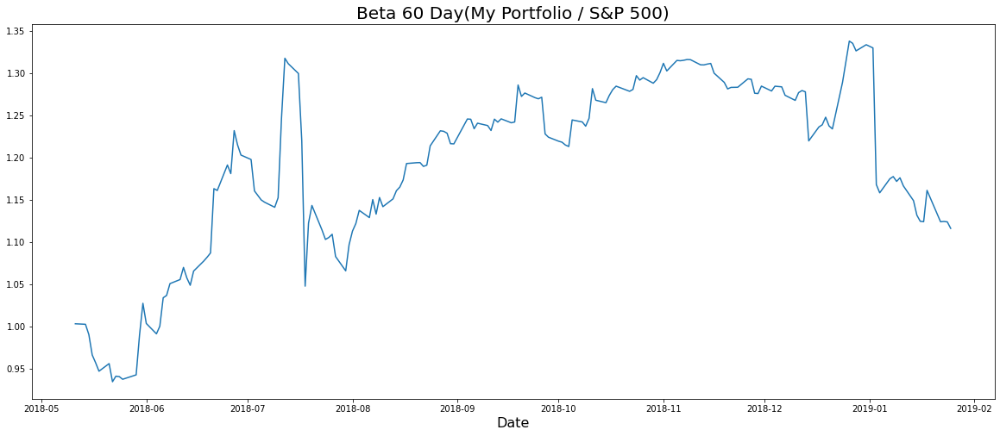

In [94]:
# Calculate and plot Beta

sp500_variance = daily_returns['S&P 500'].rolling(window=60).var()
my_covariance = daily_returns['MyReturns'].rolling(window=60).cov(daily_returns['S&P 500'])
my_beta = my_covariance / sp500_variance
fig, ax = plt.subplots()
my_beta.plot(figsize=(20, 8), ax=ax)
ax.set_xlabel('Date', fontsize=16)
ax.set_title('Beta 60 Day(My Portfolio / S&P 500)', fontsize=20)

### Using the daily returns, calculate and visualize the Sharpe ratios using a bar plot

In [42]:
# Calculate Annualzied Sharpe Ratios
my_sharpe_ratio = (daily_returns.mean() * 252) / (daily_returns.std() * np.sqrt(252))

<AxesSubplot:title={'center':'Sharpe Ratio'}, xlabel='Entity'>

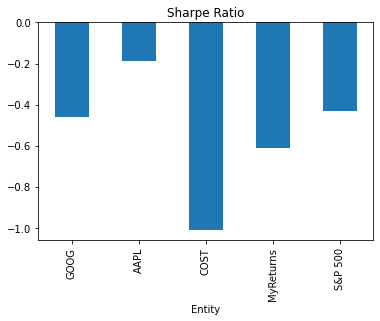

In [95]:
# Visualize the sharpe ratios as a bar plot
my_sharpe_ratio.plot(kind="bar", xlabel='Entity', title='Sharpe Ratio')

### How does your portfolio do?

Write your answer here! (See Below)

# Conclusion

### Diversification
    * It seems that two of these stocks are heavily correlated and that leaves just one that isn't
    * These gaps can cause a strain on one's portfolio caising massive fluctuation
    * Stocks should be in different sectors ranging in volatility
    * Similar price action and returns from 2 seperate assets can be utilized in another asset that will have its own "ecosystem"

### Weights
    * Personally would rather put more weight into more volatility
    * Although for balance I wouldn't have put equal parts into each asset
    * The original weights are a good baseline for how these assets behave

### How We Do?
    * Could be better and the negative sharpe ratios indicate all of our risk taking was for naught
    * The hit wasn't huge and if this was a test run it gives a good baseline as to where to go with this portfolio
    * I believe the assets are of fine quality but some diversification could especially if they are in a different sector
    * i.e. GOOG and AAPL are in the tech sector if that takes a plummet as a whole; an asset in the Pharmaceutical sector could save the portfolio
    * Also one more opinion it couldnt hurt to have a small percentage in some high risk plays to build some more capital